# Business Understanding


1. What is the typical price for a listing and what are the minimum and maximum revenue?
2.	what is the distribution of typical listing prices?
3.	How good our model is in predicting listing price?



# Data Understanding 

lets review the dataset and figure out what infromation can be extracted to answer the abovementioned questions

# Loading Required libraries 

In [177]:
import numpy as np
import pandas as pd
import sklearn
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.preprocessing import StandardScaler
import seaborn as sns
%matplotlib inline

df = pd.read_csv(r'C:\Users\aliba\Desktop\Data Science\Udacity\Projects\P1-Seattle AirBNB Data\calendar.csv')
df.head()

,listing_id,date,available,price
0,241032,2016-01-04,t,$85.00
1,241032,2016-01-05,t,$85.00
2,241032,2016-01-06,f,NaN
3,241032,2016-01-07,f,NaN
4,241032,2016-01-08,f,NaN


# Loading data & Preview

In [140]:
df2 = pd.read_csv(r'C:\Users\aliba\Desktop\Data Science\Udacity\Projects\P1-Seattle AirBNB Data\listings.csv')
pd.set_option("display.max_columns", None) # This will display the whole columns in the dataframe
pd.set_option("display.max_rows", None)
df2.head()

,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,notes,transit,thumbnail_url,medium_url,picture_url,xl_picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,street,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,city,state,zipcode,market,smart_location,country_code,country,latitude,longitude,is_location_exact,property_type,room_type,accommodates,bathrooms,bedrooms,beds,bed_type,amenities,square_feet,price,weekly_price,monthly_price,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,requires_license,license,jurisdiction_names,instant_bookable,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,reviews_per_month
0,241032,https://www.airbnb.com/rooms/241032,20160104002432,2016-01-04,Stylish Queen Anne Apartment,NaN,Make your self at home in this charming one-be...,Make your self at home in this charming one-be...,none,NaN,NaN,NaN,NaN,NaN,https://a1.muscache.com/ac/pictures/67560560/c...,NaN,956883,https://www.airbnb.com/users/show/956883,Maija,2011-08-11,"Seattle, Washington, United States","I am an artist, interior designer, and run a s...",within a few hours,96%,100%,f,https://a0.muscache.com/ac/users/956883/profil...,https://a0.muscache.com/ac/users/956883/profil...,Queen Anne,3.0,3.0,"['email', 'phone', 'reviews', 'kba']",t,t,"Gilman Dr W, Seattle, WA 98119, United States",Queen Anne,West Queen Anne,Queen Anne,Seattle,WA,98119,Seattle,"Seattle, WA",US,United States,47.636289,-122.371025,t,Apartment,Entire home/apt,4,1.0,1.0,1.0,Real Bed,"{TV,""Cable TV"",Internet,""Wireless Internet"",""A...",NaN,$85.00,NaN,NaN,NaN,NaN,2,$5.00,1,365,4 weeks ago,t,14,41,71,346,2016-01-04,207,2011-11-01,2016-01-02,95.0,10.0,10.0,10.0,10.0,9.0,10.0,f,NaN,WASHINGTON,f,moderate,f,f,2,4.07
1,953595,https://www.airbnb.com/rooms/953595,20160104002432,2016-01-04,Bright & Airy Queen Anne Apartment,Chemically sensitive? We've removed the irrita...,"Beautiful, hypoallergenic apartment in an extr...",Chemically sensitive? We've removed the irrita...,none,"Queen Anne is a wonderful, truly functional vi...",What's up with the free pillows? Our home was...,"Convenient bus stops are just down the block, ...",https://a0.muscache.com/ac/pictures/14409893/f...,https://a0.muscache.com/im/pictures/14409893/f...,https://a0.muscache.com/ac/pictures/14409893/f...,https://a0.muscache.com/ac/pictures/14409893/f...,5177328,https://www.airbnb.com/users/show/5177328,Andrea,2013-02-21,"Seattle, Washington, United States",Living east coast/left coast/overseas. Time i...,within an hour,98%,100%,t,https://a0.muscache.com/ac/users/5177328/profi...,https://a0.muscache.com/ac/users/5177328/profi...,Queen Anne,6.0,6.0,"['email', 'phone', 'facebook', 'linkedin', 're...",t,t,"7th Avenue West, Seattle, WA 98119, United States",Queen Anne,West Queen Anne,Queen Anne,Seattle,WA,98119,Seattle,"Seattle, WA",US,United States,47.639123,-122.365666,t,Apartment,Entire home/apt,4,1.0,1.0,1.0,Real Bed,"{TV,Internet,""Wireless Internet"",Kitchen,""Free...",NaN,$150.00,"$1,000.00","$3,000.00",$100.00,$40.00,1,$0.00,2,90,today,t,13,13,16,291,2016-01-04,43,2013-08-19,2015-12-29,96.0,10.0,10.0,10.0,10.0,10.0,10.0,f,NaN,WASHINGTON,f,strict,t,t,6,1.48
2,3308979,https://www.airbnb.com/rooms/3308979,20160104002432,2016-01-04,New Modern House-Amazi

In [141]:
# Lets find out the data types for the following columns
df2.dtypes[[ 'price','property_type', 'room_type', 'accommodates','bathrooms', 'bedrooms', 'beds', 'bed_type', 'amenities',
'has_availability','cleaning_fee', 'guests_included', 'extra_people', 
'minimum_nights','maximum_nights']]

price                object
property_type        object
room_type            object
accommodates          int64
bathrooms           float64
bedrooms            float64
beds                float64
bed_type             object
amenities            object
has_availability     object
cleaning_fee         object
guests_included       int64
extra_people         object
minimum_nights        int64
maximum_nights        int64
dtype: object

In [142]:
# This code will build a new datafram out of old one with the specific columns given below:
new_df2=df2[[ 'price','property_type', 'room_type', 'accommodates','bathrooms', 'bedrooms', 'beds', 'bed_type', 'has_availability','cleaning_fee', 'guests_included', 'extra_people', 
'minimum_nights','maximum_nights']].copy()
new_df2  

,price,property_type,room_type,accommodates,bathrooms,bedrooms,beds,bed_type,has_availability,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights
0,$85.00,Apartment,Entire home/apt,4,1.0,1.0,1.0,Real Bed,t,NaN,2,$5.00,1,365
1,$150.00,Apartment,Entire home/apt,4,1.0,1.0,1.0,Real Bed,t,$40.00,1,$0.00,2,90
2,$975.00,House,Entire home/apt,11,4.5,5.0,7.0,Real Bed,t,$300.00,10,$25.00,4,30
3,$100.00,Apartment,Entire home/apt,3,1.0,0.0,2.0,Real Bed,t,NaN,1,$0.00,1,1125
4,$450.00,House,Entire home/apt,6,2.0,3.0,3.0,Real Bed,t,$125.00,6,$15.00,1,1125
5,$120.00,House,Private room,2,1.0,1.0,1.0,Real Bed,t,$40.00,1,$30.00,1,6
6,$80.00,House,Private room,2,1.0,1.0,1.0,Real Bed,t,NaN,1,$10.00,3,14
7,$60.00,Cabin,Private room,2,1.0,1.0,1.0,Real Bed,t,$25.00,1,$0.00,2,7
8,$90.00,Apartment,Private room,2,1.0,1.0,1.0,Real Bed,t,NaN,1,$0.00,3,1125
9,$150.00,Apartment,Entire home/apt,4,1.0,1.0,1.0,Real Bed,t,$40.00,1,$0.00,2,365


In [143]:
# let’s handle the special character in the dataset and remove them from the columns given below:
cols_to_clean =['price','property_type', 'room_type', 'accommodates','bathrooms', 'bedrooms', 'beds', 'bed_type', 'has_availability','cleaning_fee', 'guests_included', 'extra_people', 
'minimum_nights','maximum_nights']
new_df2[cols_to_clean] = new_df2[cols_to_clean].replace({'\$': '', ',': '', '"': '', '{': '', '/': ''}, regex=True)
new_df2[cols_to_clean]


,price,property_type,room_type,accommodates,bathrooms,bedrooms,beds,bed_type,has_availability,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights
0,85.00,Apartment,Entire homeapt,4,1.0,1.0,1.0,Real Bed,t,NaN,2,5.00,1,365
1,150.00,Apartment,Entire homeapt,4,1.0,1.0,1.0,Real Bed,t,40.00,1,0.00,2,90
2,975.00,House,Entire homeapt,11,4.5,5.0,7.0,Real Bed,t,300.00,10,25.00,4,30
3,100.00,Apartment,Entire homeapt,3,1.0,0.0,2.0,Real Bed,t,NaN,1,0.00,1,1125
4,450.00,House,Entire homeapt,6,2.0,3.0,3.0,Real Bed,t,125.00,6,15.00,1,1125
5,120.00,House,Private room,2,1.0,1.0,1.0,Real Bed,t,40.00,1,30.00,1,6
6,80.00,House,Private room,2,1.0,1.0,1.0,Real Bed,t,NaN,1,10.00,3,14
7,60.00,Cabin,Private room,2,1.0,1.0,1.0,Real Bed,t,25.00,1,0.00,2,7
8,90.00,Apartment,Private room,2,1.0,1.0,1.0,Real Bed,t,NaN,1,0.00,3,1125
9,150.00,Apartment,Entire homeapt,4,1.0,1.0,1.0,Real Bed,t,40.00,1,0.00,2,365


In [144]:
# lets rename the cleaned DF after executing the above code
df_final=new_df2[cols_to_clean].copy()
df_final

,price,property_type,room_type,accommodates,bathrooms,bedrooms,beds,bed_type,has_availability,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights
0,85.00,Apartment,Entire homeapt,4,1.0,1.0,1.0,Real Bed,t,NaN,2,5.00,1,365
1,150.00,Apartment,Entire homeapt,4,1.0,1.0,1.0,Real Bed,t,40.00,1,0.00,2,90
2,975.00,House,Entire homeapt,11,4.5,5.0,7.0,Real Bed,t,300.00,10,25.00,4,30
3,100.00,Apartment,Entire homeapt,3,1.0,0.0,2.0,Real Bed,t,NaN,1,0.00,1,1125
4,450.00,House,Entire homeapt,6,2.0,3.0,3.0,Real Bed,t,125.00,6,15.00,1,1125
5,120.00,House,Private room,2,1.0,1.0,1.0,Real Bed,t,40.00,1,30.00,1,6
6,80.00,House,Private room,2,1.0,1.0,1.0,Real Bed,t,NaN,1,10.00,3,14
7,60.00,Cabin,Private room,2,1.0,1.0,1.0,Real Bed,t,25.00,1,0.00,2,7
8,90.00,Apartment,Private room,2,1.0,1.0,1.0,Real Bed,t,NaN,1,0.00,3,1125
9,150.00,Apartment,Entire homeapt,4,1.0,1.0,1.0,Real Bed,t,40.00,1,0.00,2,365


In [145]:
# lets figure out which columns do not have any Nan values
no_null = set (df_final.columns[df_final.isnull().mean()==0]) 
no_null

{'accommodates',
 'bed_type',
 'extra_people',
 'guests_included',
 'has_availability',
 'maximum_nights',
 'minimum_nights',
 'price',
 'room_type'}

In [146]:
# % of missing values in each columns
df_final.isnull().sum()/len(df_final)*100 

price                0.000000
property_type        0.026192
room_type            0.000000
accommodates         0.000000
bathrooms            0.419068
bedrooms             0.157150
beds                 0.026192
bed_type             0.000000
has_availability     0.000000
cleaning_fee        26.977475
guests_included      0.000000
extra_people         0.000000
minimum_nights       0.000000
maximum_nights       0.000000
dtype: float64

In [147]:
# % of available (not missing) values in each columns
100-df_final.isnull().sum()/len(df_final)*100 

price               100.000000
property_type        99.973808
room_type           100.000000
accommodates        100.000000
bathrooms            99.580932
bedrooms             99.842850
beds                 99.973808
bed_type            100.000000
has_availability    100.000000
cleaning_fee         73.022525
guests_included     100.000000
extra_people        100.000000
minimum_nights      100.000000
maximum_nights      100.000000
dtype: float64

In [148]:
df_final[['price', 'cleaning_fee', 'extra_people']] = df_final[['price', 'cleaning_fee', 'extra_people']].apply(pd.to_numeric)


 # Data analysis and visualization   

Takeaway 1: What is the typical price for a listing and what are the minimum and maximum revenue?

In [149]:
#lets find out about the maximum Revenue
df_final['max_revenue'] = df_final['maximum_nights'] * df_final['price']
df_final[['maximum_nights', 'price', 'max_revenue']].head()

,maximum_nights,price,max_revenue
0,365,85.0,31025.0
1,90,150.0,13500.0
2,30,975.0,29250.0
3,1125,100.0,112500.0
4,1125,450.0,506250.0


In [150]:
#lets find out about the minimum Revenue
df_final['min_revenue'] = df_final['minimum_nights'] * df_final['price']
df_final[['minimum_nights', 'price', 'min_revenue']].head()

,minimum_nights,price,min_revenue
0,1,85.0,85.0
1,2,150.0,300.0
2,4,975.0,3900.0
3,1,100.0,100.0
4,1,450.0,450.0


In [151]:
# lets find out the dataset parameters for the integer and float based columns
my_table=df_final.describe() 
my_table

,price,accommodates,bathrooms,bedrooms,beds,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,max_revenue,min_revenue
count,3818.000000,3818.000000,3802.000000,3812.000000,3817.000000,2788.000000,3818.000000,3818.000000,3818.000000,3818.000000,3.818000e+03,3818.000000
mean,127.976166,3.349398,1.259469,1.307712,1.735394,61.710904,1.672603,10.667627,2.369303,780.447617,9.937197e+04,328.662651
std,90.250022,1.977599,0.590369,0.883395,1.139480,48.830341,1.311040,17.585922,16.305902,1683.589007,1.911217e+05,2460.861193
min,20.000000,1.000000,0.000000,0.000000,1.000000,5.000000,0.000000,0.000000,1.000000,1.000000,3.500000e+01,20.000000
25%,75.000000,2.000000,1.000000,1.000000,1.000000,25.000000,1.000000,0.000000,1.000000,60.000000,7.500000e+03,95.000000
50%,100.000000,3.000000,1.000000,1.000000,1.000000,50.000000,1.000000,0.000000,2.000000,1125.000000,7.875000e+04,178.000000
75%,150.000000,4.000000,1.000000,2.000000,2.000000,83.000000,2.000000,20.000000,2.000000,1125.000000,1.350000e+05,310.000000
max,1000.000000,16.000000,8.000000,7.000000,15.000000,300.000000,15.000000,300.000000,1000.000000,100000.000000,1.000000e+07,150000.000000


In [152]:
#lets summarize the listing price parameters and min, max revenue
my_table[['price', 'minimum_nights', 'maximum_nights', 'min_revenue', 'max_revenue']].copy()

,price,minimum_nights,maximum_nights,min_revenue,max_revenue
count,3818.000000,3818.000000,3818.000000,3818.000000,3.818000e+03
mean,127.976166,2.369303,780.447617,328.662651,9.937197e+04
std,90.250022,16.305902,1683.589007,2460.861193,1.911217e+05
min,20.000000,1.000000,1.000000,20.000000,3.500000e+01
25%,75.000000,1.000000,60.000000,95.000000,7.500000e+03
50%,100.000000,2.000000,1125.000000,178.000000,7.875000e+04
75%,150.000000,2.000000,1125.000000,310.000000,1.350000e+05
max,1000.000000,1000.000000,100000.000000,150000.000000,1.000000e+07


Takeaway 2: what is the distribution of typical listing prices

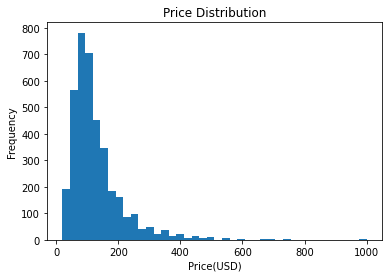

In [153]:
# lets figure out the distribution of prices in the dataset
ax = df_final['price'].plot.hist(bins=40) 
plt.title('Price Distribution')
plt.xlabel('Price(USD)')
plt.ylabel('Frequency')
plt.savefig('output.png', bbox_inches='tight', dpi=600)

In [188]:
def residual(df_final):
    """
    This function will subtract each price value in the price column from mean price
    and will print the residulal
    
    """
    df_final_new1 = pd.DataFrame(df_final)
    df_final_new2 = df_final_new1['price'] - df_final_new1['price'].mean()
    return df_final_new2

print(residual(df_final))



0       -42.976166
1        22.023834
2       847.023834
3       -27.976166
4       322.023834
5        -7.976166
6       -47.976166
7       -67.976166
8       -37.976166
9        22.023834
10      -32.976166
11      -28.976166
12      117.023834
13       37.023834
14      333.023834
15      -18.976166
16      -61.976166
17      -28.976166
18       72.023834
19      572.023834
20      -17.976166
21      -28.976166
22      322.023834
23      -52.976166
24      472.023834
25      322.023834
26       22.023834
27      -82.976166
28      172.023834
29      -47.976166
30       47.023834
31      197.023834
32       47.023834
33       94.023834
34       31.023834
35       -2.976166
36      220.023834
37      -82.976166
38       22.023834
39      -47.976166
40      -17.976166
41       20.023834
42      222.023834
43       22.023834
44       22.023834
45      -27.976166
46      221.023834
47      -17.976166
48       32.023834
49        2.023834
50      -28.976166
51      -27.976166
52        9.

In [155]:
#Lets add price residal to the df_fina Datafram
df_final['price_residual'] = residual(df_final)
df_final.head()

,price,property_type,room_type,accommodates,bathrooms,bedrooms,beds,bed_type,has_availability,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,max_revenue,min_revenue,price_residual
0,85.0,Apartment,Entire homeapt,4,1.0,1.0,1.0,Real Bed,t,NaN,2,5.0,1,365,31025.0,85.0,-42.976166
1,150.0,Apartment,Entire homeapt,4,1.0,1.0,1.0,Real Bed,t,40.0,1,0.0,2,90,13500.0,300.0,22.023834
2,975.0,House,Entire homeapt,11,4.5,5.0,7.0,Real Bed,t,300.0,10,25.0,4,30,29250.0,3900.0,847.023834
3,100.0,Apartment,Entire homeapt,3,1.0,0.0,2.0,Real Bed,t,NaN,1,0.0,1,1125,112500.0,100.0,-27.976166
4,450.0,House,Entire homeapt,6,2.0,3.0,3.0,Real Bed,t,125.0,6,15.0,1,1125,506250.0,450.0,322.023834


In [156]:
# lets figure out the distribution of prices based on room type in the dataset and visulaize it. 
df_final[['room_type', 'price']].groupby('room_type', as_index=False).mean()

,room_type,price
0,Entire homeapt,155.843369
1,Private room,75.044828
2,Shared room,47.547009


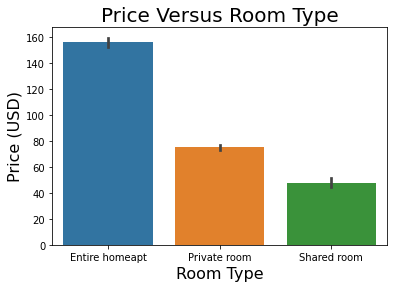

In [157]:
ax = sns.barplot(x='room_type', y='price', data=df_final)
plt.xlabel('Room Type', fontsize=16)
plt.ylabel('Price (USD)',  fontsize=16)
ax.set_title('Price Versus Room Type', fontsize=20)
plt.savefig('output1.png', bbox_inches='tight', dpi=600)
plt.show()

In [158]:
# lets figure out the distribution of prices based on property type in the dataset and visulaize it. 
df_final[['property_type', 'price']].groupby('property_type', as_index=False).mean()


,property_type,price
0,Apartment,122.932670
1,Bed & Breakfast,112.054054
2,Boat,282.375000
3,Bungalow,115.615385
4,Cabin,104.666667
5,CamperRV,120.461538
6,Chalet,98.500000
7,Condominium,151.109890
8,Dorm,39.500000
9,House,132.351414


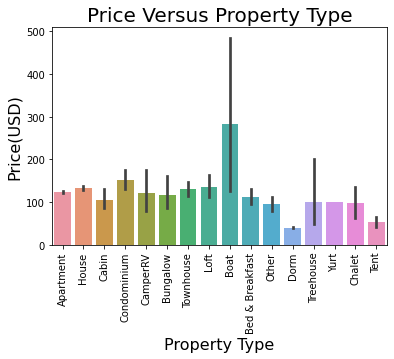

In [159]:
ax = sns.barplot(x='property_type', y='price', data=df_final)
plt.xlabel('Property Type', fontsize=16)
plt.ylabel('Price(USD)',  fontsize=16)
ax.set_title('Price Versus Property Type', fontsize=20)
plt.xticks(rotation = 90)
plt.savefig('output2.png', bbox_inches='tight', dpi=600)
plt.show()

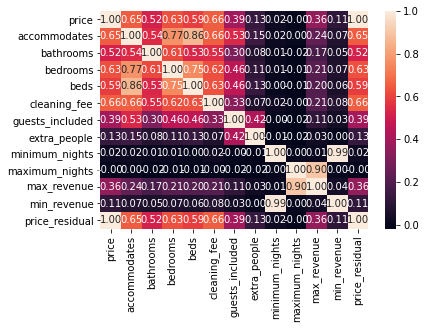

In [160]:
sns.heatmap(df_final.corr(), annot=True, fmt='.2f');

# Handling the null values and building Linear Regression model

Takeaway 3: How good our model is in predicting listing price?

In [161]:
#Lets figure out the columns with missing values first
100-df_final.isnull().sum()/len(df_final)*100

price               100.000000
property_type        99.973808
room_type           100.000000
accommodates        100.000000
bathrooms            99.580932
bedrooms             99.842850
beds                 99.973808
bed_type            100.000000
has_availability    100.000000
cleaning_fee         73.022525
guests_included     100.000000
extra_people        100.000000
minimum_nights      100.000000
maximum_nights      100.000000
max_revenue         100.000000
min_revenue         100.000000
price_residual      100.000000
dtype: float64

In [162]:
# lets handel missing null values by filling mean for int and float based columns
cols=['bathrooms', 'bedrooms', 'beds', 'cleaning_fee']
df_final[cols] = df_final[cols].fillna((df_final[cols].mean()))
df_final[cols]


,bathrooms,bedrooms,beds,cleaning_fee
0,1.000000,1.000000,1.000000,61.710904
1,1.000000,1.000000,1.000000,40.000000
2,4.500000,5.000000,7.000000,300.000000
3,1.000000,0.000000,2.000000,61.710904
4,2.000000,3.000000,3.000000,125.000000
5,1.000000,1.000000,1.000000,40.000000
6,1.000000,1.000000,1.000000,61.710904
7,1.000000,1.000000,1.000000,25.000000
8,1.000000,1.000000,1.000000,61.710904
9,1.000000,1.000000,1.000000,40.000000


In [163]:
# Now you can see that bathroom, bedroom and bed has 100% data! only one columns with object dtype needs to be handeled 
100-df_final.isnull().sum()/len(df_final)*100 

price               100.000000
property_type        99.973808
room_type           100.000000
accommodates        100.000000
bathrooms           100.000000
bedrooms            100.000000
beds                100.000000
bed_type            100.000000
has_availability    100.000000
cleaning_fee        100.000000
guests_included     100.000000
extra_people        100.000000
minimum_nights      100.000000
maximum_nights      100.000000
max_revenue         100.000000
min_revenue         100.000000
price_residual      100.000000
dtype: float64

In [164]:
df_final_mode=df_final['property_type'].mode()
df_final_mode

0    House
dtype: object

In [165]:
# Use these lines of code to replace missing NAN values with mode in Objective dtype columns 
cols = ["property_type"] 

df_final[cols]=df_final[cols].fillna(df_final.mode().iloc[0])
df_final[cols]

,property_type
0,Apartment
1,Apartment
2,House
3,Apartment
4,House
5,House
6,House
7,Cabin
8,Apartment
9,Apartment


In [166]:
# Now you can see that we did take care of all columns with NAN values 
100-df_final.isnull().sum()/len(df_final)*100

price               100.0
property_type       100.0
room_type           100.0
accommodates        100.0
bathrooms           100.0
bedrooms            100.0
beds                100.0
bed_type            100.0
has_availability    100.0
cleaning_fee        100.0
guests_included     100.0
extra_people        100.0
minimum_nights      100.0
maximum_nights      100.0
max_revenue         100.0
min_revenue         100.0
price_residual      100.0
dtype: float64

# Which features are categorical?

In [167]:
cat_df = df_final.select_dtypes(include=['object']).copy()
cat_df.head()

,property_type,room_type,bed_type,has_availability
0,Apartment,Entire homeapt,Real Bed,t
1,Apartment,Entire homeapt,Real Bed,t
2,House,Entire homeapt,Real Bed,t
3,Apartment,Entire homeapt,Real Bed,t
4,House,Entire homeapt,Real Bed,t


In [168]:
cat_df.shape[1]

4

# Encoding Categorical Variable

In [169]:
df_final_dummies = pd.get_dummies(df_final,
                     columns = ['property_type', 'room_type', 'bed_type','has_availability'])
  
print(df_final_dummies)


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [170]:
# all columns are converted to integer based ones and the dataset is ready to be used for the prediction purposes: 
main_df=df_final_dummies
main_df.head()

,price,accommodates,bathrooms,bedrooms,beds,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,max_revenue,min_revenue,price_residual,property_type_Apartment,property_type_Bed & Breakfast,property_type_Boat,property_type_Bungalow,property_type_Cabin,property_type_CamperRV,property_type_Chalet,property_type_Condominium,property_type_Dorm,property_type_House,property_type_Loft,property_type_Other,property_type_Tent,property_type_Townhouse,property_type_Treehouse,property_type_Yurt,room_type_Entire homeapt,room_type_Private room,room_type_Shared room,bed_type_Airbed,bed_type_Couch,bed_type_Futon,bed_type_Pull-out Sofa,bed_type_Real Bed,has_availability_t
0,85.0,4,1.0,1.0,1.0,61.710904,2,5.0,1,365,31025.0,85.0,-42.976166,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,1
1,150.0,4,1.0,1.0,1.0,40.000000,1,0.0,2,90,13500.0,300.0,22.023834,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,1
2,975.0,11,4.5,5.0,7.0,300.000000,10,25.0,4,30,29250.0,3900.0,847.023834,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,1
3,100.0,3,1.0,0.0,2.0,61.710904,1,0.0,1,1125,112500.0,100.0,-27.976166,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,1
4,450.0,6,2.0,3.0,3.0,125.000000,6,15.0,1,1125,506250.0,450.0,322.023834,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,1


#  Linear Regression implementation for the the listing price prediction 

In [171]:
#Split into explanatory and response variables
X=main_df.drop('price', axis=1)
y=main_df['price']

#Split into train and test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .30, random_state=42) 

sc = StandardScaler()
x_train = sc.fit_transform(X_train)
x_test = sc.fit_transform(X_test)

lm_model = LinearRegression(normalize=True) # Instantiate
lm_model.fit(X_train, y_train) #Fit
        
#Predict and score the model
y_test_preds = lm_model.predict(X_test) 
"The r-squared score for the model using only quantitative variables was {} on {} values.".format(r2_score(y_test, y_test_preds), len(y_test))


'The r-squared score for the model using only quantitative variables was 1.0 on 1146 values.'

In [172]:
rms = mean_squared_error(y_test, y_test_preds, squared=False)
rms

3.289543193756127e-13